# Object Detection Tutorial

## Part 1: Preliminary Steps

#### 1. Create an Anaconda environment with python version 3.6.

*conda create -n retinanet python=3.6 anaconda*
#### 2. Activate the environment and install the necessary packages.

*source activate retinanet* <br>
*conda install tensorflow numpy scipy opencv pillow matplotlib h5py keras*
#### 3. Then install the ImageAI library.

*pip install https://github.com/OlafenwaMoses/ImageAI/releases/download/2.0.1/imageai-2.0.1-py3-none-any.whl*

#### 4. Now download the pretrained model required to generate predictions. This model is based on RetinaNet. Click on the link to download –  [RetinaNet Pretrained model](https://github.com/OlafenwaMoses/ImageAI/releases/download/1.0/resnet50_coco_best_v2.0.1.h5) 

#### 5. Copy the downloaded file to your current working folder, e.g., "Documents/MLWorkshop"

#### 6. Download the example image from [here](http://www.trbimg.com/img-56ce10f2/turbine/redeye-data-shows-chicago-pedestrian-fatalities-on-the-rise-20160224). Name the image as "testImage.png" and save it under "Documents/MLWorkshop".

#### 7. Open jupyter notebook: type "jupyter notebook" in your terminal (from the current working folder)



---------------------------------------------------------------------------------------------------------------------------------

## Part 2: Now the fun part!

In [1]:
# import dependencies
from imageai.Detection import ObjectDetection
import os

Using TensorFlow backend.


Note: If you get errors like "ImageAI not found", run the command below and try again. 

* pip install https://github.com/OlafenwaMoses/ImageAI/releases/download/2.0.2/imageai-2.0.2-py3-none-any.whl
 

In [2]:
#variable to hold the path to the folder where our python file, RetinaNet model file and images are
execution_path = os.getcwd()

In [3]:
detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
custom_objects = detector.CustomObjects(person=True, car=False)
detections = detector.detectCustomObjectsFromImage(input_image=os.path.join(execution_path , "testImage.png"), output_image_path=os.path.join(execution_path , "testImage_new.png"), custom_objects=custom_objects, minimum_percentage_probability=65)


**What did we just do?** 
- We defined our object detection class
- We set the model type to RetinaNet
- We set the model path to the path of our RetinaNet model
- We loaded the model into the object detection class
- We called the detection function with CustomObjects set to detect only people

Let's iterate over all the results returned by the detector.detectObjectsFromImage function and print out the name and percentage probability of each detected object.

In [4]:
for eachObject in detections:
   print(eachObject["name"] + " : " + eachObject["percentage_probability"] )
   print("--------------------------------")

person : 75.72211623191833
--------------------------------
person : 90.96093773841858
--------------------------------
person : 96.88708782196045
--------------------------------
person : 97.08946943283081
--------------------------------
person : 87.93438673019409
--------------------------------


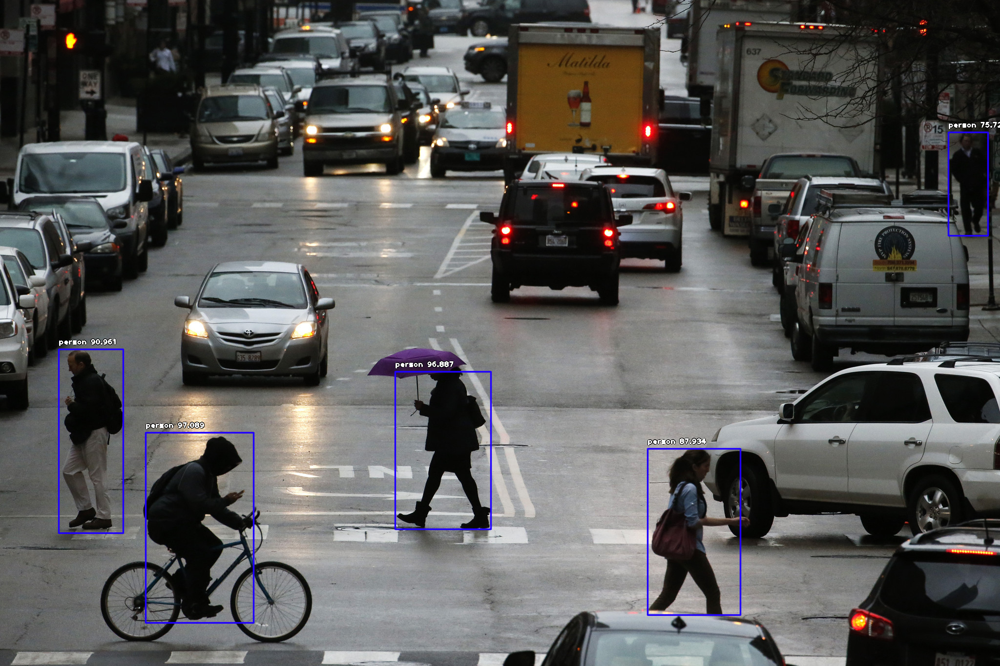

In [5]:
#To print the resulting image
from IPython.display import Image
Image("testImage_new.png")

## Part 3: Exercises

### Exercise 1:

**Adjusting Minimum Probability**: By default, objects detected with a probability percentage of less than 50 will not be shown or reported. You can increase this value for high certainty cases or reduce the value for cases where all possible objects are needed to be detected.

- Tweak the **minimum_percentage_probability** parameter and see how the ouptut changes.

### Exercise 2 :

**Custom Objects Detection**: Using a provided CustomObject class, you can tell the detection class to report detections on one or a few number of unique objects.

- Update the  **custom_objects** parameter to detect cars as well
- Remove the **custom_objects** parameter. 

### Exercise 3:
Upload your own image and run the model again.

### Reference 
####  ImageAI's official GitHub repository: https://github.com/OlafenwaMoses/ImageAI

--------------------------------------------------------------------------------------------------------------------------------

### Example Solutions 

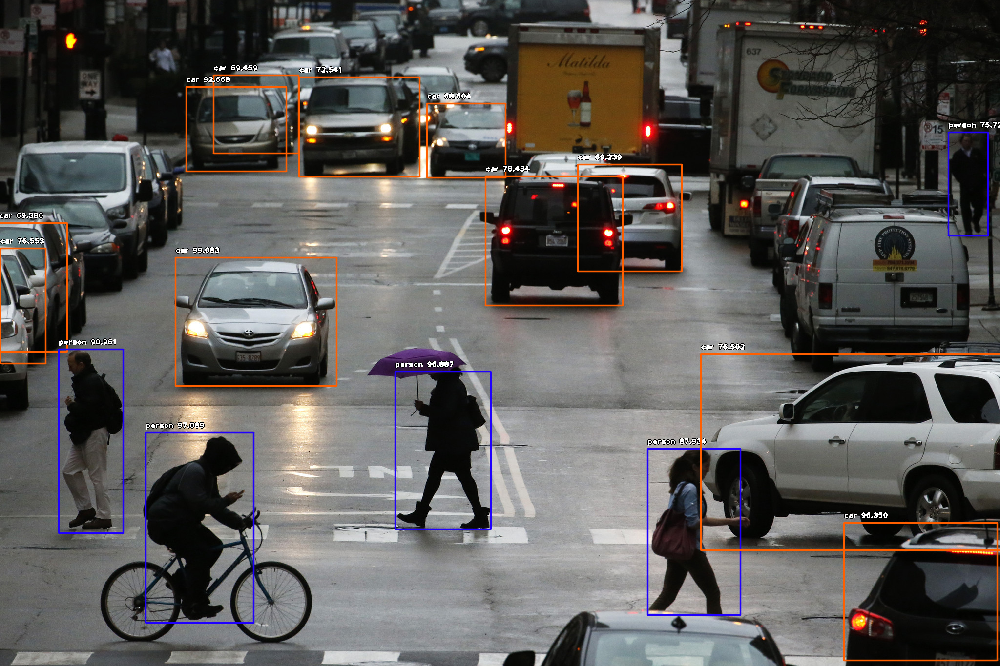

In [6]:
#Example_Solution_2_a
custom_objects = detector.CustomObjects(person=True, car=True)
detections = detector.detectCustomObjectsFromImage(input_image=os.path.join(execution_path , "testImage.png"), output_image_path=os.path.join(execution_path , "testImage_new_a.png"), custom_objects=custom_objects, minimum_percentage_probability=65)

Image("testImage_new_a.png")

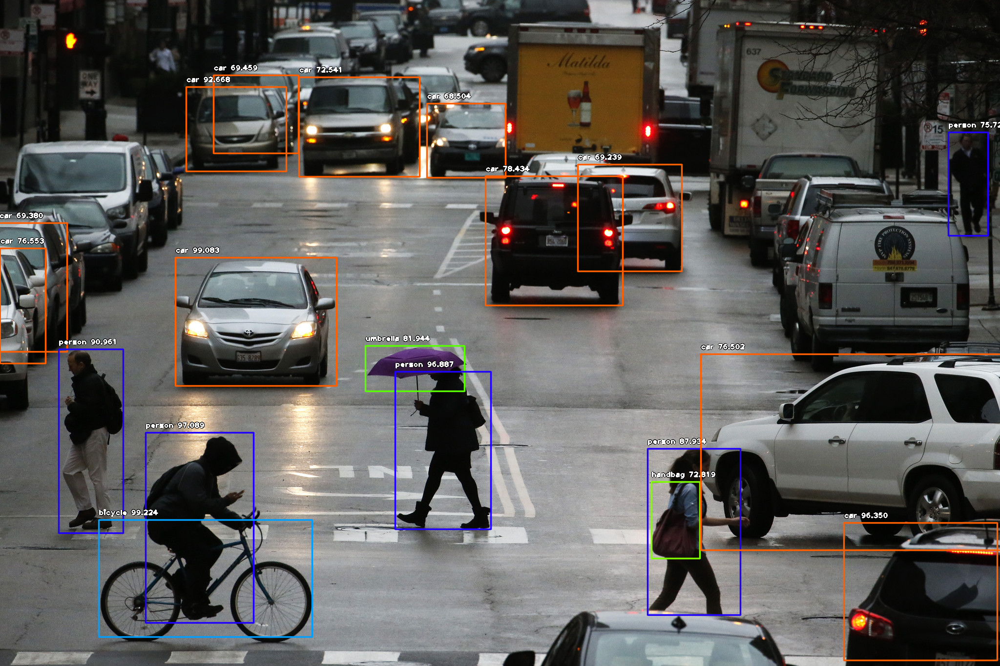

In [7]:
#Example_Solution_2_b

detections = detector.detectCustomObjectsFromImage(input_image=os.path.join(execution_path , "testImage.png"), output_image_path=os.path.join(execution_path , "testImage_new_b.png"), minimum_percentage_probability=65)

Image("testImage_new_b.png")